## Data processing

In [6]:
# -*- coding: utf-8 -*-

import sys,os
import numpy as np
import pandas as pd
import scipy.stats as stats
from scipy import linalg
from numpy import dot
import matplotlib
import geomloss as gs

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torch.distributions as D
from torchvision import datasets, transforms
import torchvision.utils as vutils
from torch.autograd import grad
import torch.utils.data
import torch.backends.cudnn as cudnn
from torch.nn.modules import Linear
from torch.autograd.functional import jacobian,hessian,vjp,vhp,hvp

import random
import math

## The data processing steps for the steam cell dataset is the same as that in https://github.com/thashim/population-diffusions. 
FilePath = '../../'

file_list = ['GSM1599494_ES_d0_main.csv', 'GSM1599497_ES_d2_LIFminus.csv', 'GSM1599498_ES_d4_LIFminus.csv', 'GSM1599499_ES_d7_LIFminus.csv']
table_list = []
for filein in file_list:
    table_list.append(pd.read_csv(FilePath+filein, header=None))

matrix_list = []
gene_names = table_list[0].values[:,0]

for table in table_list:
    matrix_list.append(table.values[:,1:].astype('float32'))

cell_counts = [matrix.shape[1] for matrix in matrix_list]

# Normalization
def normalize_run(mat):
    rpm = np.sum(mat,0)/1e6
    detect_pr = np.sum(mat==0,0)/float(mat.shape[0])
    return np.log(mat*(np.median(detect_pr)/detect_pr)*1.0/rpm + 1.0)

norm_mat = [normalize_run(matrix) for matrix in matrix_list]

## 14 genes
wsub = np.array([14219,23779,6194,20332,6844,4941,4942,11403,11408,20330,20376,11272,11237,6128])-1

def nmf(X, latent_features, max_iter=100, error_limit=1e-6, fit_error_limit=1e-6, print_iter=200):
    """
    Decompose X to A*Y
    """
    eps = 1e-5
    print('Starting NMF decomposition with {} latent features and {} iterations.'.format(latent_features, max_iter))
    #X = X.toarray()   I am passing in a scipy sparse matrix

    # mask
    mask = np.sign(X)

    # initial matrices. A is random [0,1] and Y is A\X.
    rows, columns = X.shape
    A = np.random.rand(rows, latent_features)
    A = np.maximum(A, eps)

    Y = linalg.lstsq(A, X)[0]
    Y = np.maximum(Y, eps)

    masked_X = mask * X
    X_est_prev = dot(A, Y)
    for i in range(1, max_iter + 1):
        # ===== updates =====
        # Matlab: A=A.*(((W.*X)*Y')./((W.*(A*Y))*Y'));
        top = dot(masked_X, Y.T)
        bottom = (dot((mask * dot(A, Y)), Y.T)) + eps
        A *= top / bottom

        A = np.maximum(A, eps)
        # print 'A',  np.round(A, 2)

        # Matlab: Y=Y.*((A'*(W.*X))./(A'*(W.*(A*Y))));
        top = dot(A.T, masked_X)
        bottom = dot(A.T, mask * dot(A, Y)) + eps
        Y *= top / bottom
        Y = np.maximum(Y, eps)
        # print 'Y', np.round(Y, 2)


        # ==== evaluation ====
        if i % print_iter == 0 or i == 1 or i == max_iter:
            print('Iteration {}:'.format(i),)
            X_est = dot(A, Y)
            err = mask * (X_est_prev - X_est)
            fit_residual = np.sqrt(np.sum(err ** 2))
            X_est_prev = X_est

            curRes = linalg.norm(mask * (X - X_est), ord='fro')
            print('fit residual', np.round(fit_residual, 4),)
            print('total residual', np.round(curRes, 4))
            if curRes < error_limit or fit_residual < fit_error_limit:
                break
    return A, Y, dot(A,Y)

np.random.seed(0)
norm_imputed = [nmf(normin[wsub,:], latent_features = len(wsub)*4, max_iter=500)[2] for normin in norm_mat]

norm_adj = np.mean(norm_imputed[3],1)[:,np.newaxis]
subvec = np.array(list(range(14)))

print(gene_names[wsub])

cov_mat = np.cov(norm_imputed[3][subvec,:])
whiten = np.diag(np.diag(cov_mat)**(-0.5))
unwhiten = np.diag(np.diag(cov_mat)**(0.5))

norm_imputed2 = [np.dot(whiten,(normin - norm_adj)[subvec,:]) for normin in norm_imputed]

Starting NMF decomposition with 56 latent features and 500 iterations.
Iteration 1:
fit residual 381.5832
total residual 40.9294
Iteration 200:
fit residual 40.5985
total residual 1.4135
Iteration 400:
fit residual 1.2036
total residual 0.2692
Iteration 500:
fit residual 0.1305
total residual 0.1455
Starting NMF decomposition with 56 latent features and 500 iterations.
Iteration 1:
fit residual 210.6748
total residual 14.8275
Iteration 200:
fit residual 14.8186
total residual 0.0597
Iteration 400:
fit residual 0.058
total residual 0.0019
Iteration 500:
fit residual 0.0015
total residual 0.0005
Starting NMF decomposition with 56 latent features and 500 iterations.
Iteration 1:
fit residual 395.6897
total residual 29.8804
Iteration 200:
fit residual 29.8694
total residual 0.1064
Iteration 400:
fit residual 0.0992
total residual 0.0098
Iteration 500:
fit residual 0.0061
total residual 0.0039
Starting NMF decomposition with 56 latent features and 500 iterations.
Iteration 1:
fit residual 4

## Model settings

In [7]:
# multi-layer perceptron
class MLP(nn.Module):

    def __init__(self, dim_in, dim_out, dim_hidden=64, num_hidden=0, activation=nn.LeakyReLU()):
        super(MLP, self).__init__()

        if num_hidden == 0:
            self.linears = nn.ModuleList([nn.Linear(dim_in, dim_out)])
        elif num_hidden >= 1:
            self.linears = nn.ModuleList() 
            self.linears.append(nn.Linear(dim_in, dim_hidden))
            self.linears.extend([nn.Linear(dim_hidden, dim_hidden) for _ in range(num_hidden-1)])
            self.linears.append(nn.Linear(dim_hidden, dim_out))
        else:
            raise Exception('number of hidden layers must be positive')

        for m in self.linears:
            #nn.init.xavier_uniform_(m.weight)
            nn.init.xavier_normal_(m.weight)
            nn.init.uniform_(m.bias,a=-0.1,b=0.1)
            #nn.init.constant_(m.bias,0) 
 
        self.activation = activation 

    def forward(self, x):
        for m in self.linears[:-1]:
            x = self.activation(m(x))
            #x = F.dropout(x,p=0.5)

        return self.linears[-1](x)


def compute_gradient_penalty(D, real_sample, fake_sample,k,p):
    real_samples = real_sample.requires_grad_(True)
    fake_samples = fake_sample.requires_grad_(True)

    real_validity = D(real_samples)
    fake_validity = D(fake_samples)

    real_grad_out = torch.ones((real_samples.shape[0],1),dtype=torch.float32,requires_grad=False,device="cuda")
    real_grad = grad(
        real_validity, real_samples, real_grad_out, create_graph=True, retain_graph=True, only_inputs=True
    )[0]
    real_grad_norm = real_grad.view(real_grad.size(0), -1).pow(2).sum(1) ** (p / 2)

    fake_grad_out = torch.ones((fake_samples.shape[0],1),dtype=torch.float32,requires_grad=False,device="cuda")
    fake_grad = grad(
        fake_validity, fake_samples, fake_grad_out, create_graph=True, retain_graph=True, only_inputs=True
    )[0]
    fake_grad_norm = fake_grad.view(fake_grad.size(0), -1).pow(2).sum(1) ** (p / 2)

    return (torch.sum(real_grad_norm) + torch.sum(fake_grad_norm)) * k / (real_sample.shape[0]+fake_sample.shape[0])

# The Euler-Maruyama (EM) discretization scheme
class JumpEulerForwardCuda(nn.Module):
    def __init__(self,in_features,num_hidden,dim_hidden,step_size,intensity,bd):
        super(JumpEulerForwardCuda,self).__init__()

        self.drift = MLP(in_features,in_features,dim_hidden,num_hidden)
        self.intensity = torch.tensor(intensity,device="cuda")
        self.mean = nn.Parameter(0.01*torch.ones(in_features))
        self.covHalf = nn.Parameter(0.08*torch.eye(in_features))
        self.diffusion = nn.Parameter(torch.ones(bd,in_features))
        self.in_features = in_features
        self.jump = MLP(in_features,in_features,dim_hidden,num_hidden)
        self.step_size = step_size

    def forward(self,z0,Nsim,steps):

        PopulationPath = torch.empty(size = (Nsim,steps+1,self.in_features),device="cuda")
        PopulationPath[:,0,:] = z0
        state = z0

        for i in range(1,steps+1):
            DP = D.poisson.Poisson(self.intensity*self.step_size) 
            pois = DP.sample((Nsim,1)).cuda()
            state = state + self.drift(state)*self.step_size + math.sqrt(self.step_size)*torch.normal(0,1,size=(Nsim,bd),device="cuda")@self.diffusion+\
                (pois*self.mean + pois**(0.5)*torch.normal(0,1,size=(Nsim,self.in_features),device="cuda")@self.covHalf)*self.jump(state)
            PopulationPath[:,i,:] = state
        return PopulationPath


# random seeds
def setup_seed(seed):
     torch.manual_seed(seed)
     torch.cuda.manual_seed_all(seed)
     np.random.seed(seed)
     random.seed(seed)
     torch.backends.cudnn.deterministic = True

a=gs.SamplesLoss(loss='sinkhorn',p=2,blur=0.01)


# training data and hyper-parameter setting
train_data = norm_imputed2

train0 = torch.tensor(train_data[0],dtype=torch.float32,requires_grad = True,device="cuda").t()
train2 = torch.tensor(train_data[1],dtype=torch.float32,requires_grad = True,device="cuda").t()
train4 = torch.tensor(train_data[2],dtype=torch.float32,requires_grad = True,device="cuda").t()
train7 = torch.tensor(train_data[3],dtype=torch.float32,requires_grad = True,device="cuda").t()


sed = 200
intensity = 10
lr = 0.0003
step_size = 0.03
kuan = 256
ceng = 4
bd = 2
n_critic = 3
k = 2
p = 6

n_sims = train0.shape[0]
in_features = train0.shape[1]
n_steps = [10,20,35]

setup_seed(sed)

# generator and critics
netG = JumpEulerForwardCuda(in_features,ceng,kuan,step_size,intensity,bd).cuda()
netD1 = MLP(in_features,1,dim_hidden=kuan,num_hidden=ceng).cuda()
netD2 = MLP(in_features,1,dim_hidden=kuan,num_hidden=ceng).cuda()
netD3 = MLP(in_features,1,dim_hidden=kuan,num_hidden=ceng).cuda()


optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(0.5, 0.999))
optimizerSD1 = optim.Adam(netD1.parameters(), lr=lr, betas=(0.5, 0.999))
optimizerSD2 = optim.Adam(netD2.parameters(), lr=lr, betas=(0.5, 0.999))
optimizerSD3 = optim.Adam(netD3.parameters(), lr=lr, betas=(0.5, 0.999))



In [8]:
## if True, training process starts
## if False, our trained model will be used
training = True

if training:
    n_epochs =  30000

    for epoch in range(n_epochs):


        # -------------------
        # train the critics
        # -------------------


        for _ in range(n_critic):
            fake_data = netG(train0,n_sims,n_steps[2])
            fake1 = fake_data[:,n_steps[0],:]
            fake2 = fake_data[:,n_steps[1],:]
            fake3 = fake_data[:,n_steps[2],:]

            optimizerSD1.zero_grad()

            div_gp1 = compute_gradient_penalty(netD1,train2,fake1,k,p)
            d1_loss = -torch.mean(netD1(train2))+torch.mean(netD1(fake1))+div_gp1
            d1_loss.backward(retain_graph=True) 

            optimizerSD1.step()


            optimizerSD2.zero_grad()

            div_gp2 = compute_gradient_penalty(netD2,train4,fake2,k,p)
            d2_loss = -torch.mean(netD2(train4))+torch.mean(netD2(fake2))+div_gp2
            d2_loss.backward(retain_graph=True)

            optimizerSD2.step()


            optimizerSD3.zero_grad()

            div_gp3 = compute_gradient_penalty(netD3,train7,fake3,k,p)
            d3_loss = -torch.mean(netD3(train7))+torch.mean(netD3(fake3))+div_gp3
            d3_loss.backward(retain_graph=True)

            optimizerSD3.step()



        # ----------------
        # train the generator
        # ----------------


        for _ in range(1):
            optimizerG.zero_grad()
            fake_data = netG(train0,n_sims,n_steps[2])
            fake1 = fake_data[:,n_steps[0],:]
            fake2 = fake_data[:,n_steps[1],:]
            fake3 = fake_data[:,n_steps[2],:]
            g_loss = -torch.mean(netD1(fake1))-torch.mean(netD2(fake2))-torch.mean(netD3(fake3))
            g_loss.backward() 

            optimizerG.step()

        if epoch %10==0:
            print("d1_loss: ",d1_loss.item(),", d2_loss: ",d2_loss.item(),", d3_loss ",d3_loss.item())
            print("g_loss: ",g_loss.item())
            
    ## save the parameters of the neural networks
    torch.save(netG.state_dict(),"./TrainedModel/14GenesnetG.pt")
else:
    netG.load_state_dict(torch.load('./TrainedModel/14GenesnetG.pt')) ## load the trained model directly

d1_loss:  -0.1710548847913742 , d2_loss:  -0.5808389782905579 , d3_loss  -0.4938359260559082
g_loss:  1.9335954189300537
d1_loss:  -1.7792850732803345 , d2_loss:  -2.2930402755737305 , d3_loss  -4.333424091339111
g_loss:  9.035283088684082
d1_loss:  -2.2954628467559814 , d2_loss:  -1.9375436305999756 , d3_loss  -1.9084692001342773
g_loss:  0.9863139390945435
d1_loss:  -2.1011574268341064 , d2_loss:  -1.7897014617919922 , d3_loss  -1.426261067390442
g_loss:  -0.522287130355835
d1_loss:  -1.8340699672698975 , d2_loss:  -1.6487078666687012 , d3_loss  -1.134597897529602
g_loss:  -1.6218034029006958
d1_loss:  -1.57667875289917 , d2_loss:  -1.5317738056182861 , d3_loss  -0.868553876876831
g_loss:  -2.5538997650146484
d1_loss:  -1.3181816339492798 , d2_loss:  -1.5413566827774048 , d3_loss  -0.7150598764419556
g_loss:  -1.5715749263763428
d1_loss:  -1.263973355293274 , d2_loss:  -1.4774972200393677 , d3_loss  -0.706324577331543
g_loss:  -1.6272395849227905
d1_loss:  -1.1482523679733276 , d2_lo

d1_loss:  -1.0523178577423096 , d2_loss:  -0.7190189957618713 , d3_loss  -0.7266672849655151
g_loss:  -0.19315895438194275
d1_loss:  -1.0792564153671265 , d2_loss:  -0.7852317094802856 , d3_loss  -0.6312721967697144
g_loss:  -0.8524248600006104
d1_loss:  -1.1284215450286865 , d2_loss:  -0.9241397976875305 , d3_loss  -0.5735048651695251
g_loss:  -1.2627736330032349
d1_loss:  -1.0666899681091309 , d2_loss:  -0.7931597828865051 , d3_loss  -0.6184741258621216
g_loss:  -0.7633643746376038
d1_loss:  -1.0571249723434448 , d2_loss:  -0.7536325454711914 , d3_loss  -0.6386577486991882
g_loss:  -0.4557362198829651
d1_loss:  -1.0831855535507202 , d2_loss:  -0.7991800308227539 , d3_loss  -0.6230050325393677
g_loss:  -0.8244324326515198
d1_loss:  -1.018904209136963 , d2_loss:  -0.7777527570724487 , d3_loss  -0.6664710640907288
g_loss:  -0.4155358374118805
d1_loss:  -1.0688247680664062 , d2_loss:  -0.7821441292762756 , d3_loss  -0.6342414021492004
g_loss:  -0.6596274375915527
d1_loss:  -1.06158411502

d1_loss:  -1.0696359872817993 , d2_loss:  -0.7682665586471558 , d3_loss  -0.8273839950561523
g_loss:  0.12848630547523499
d1_loss:  -1.0811291933059692 , d2_loss:  -0.7818118333816528 , d3_loss  -0.8139940500259399
g_loss:  0.058484166860580444
d1_loss:  -1.0926141738891602 , d2_loss:  -0.7692633271217346 , d3_loss  -0.8325697183609009
g_loss:  0.3183425962924957
d1_loss:  -1.1035449504852295 , d2_loss:  -0.7587568759918213 , d3_loss  -0.8389824628829956
g_loss:  0.12571880221366882
d1_loss:  -1.1052812337875366 , d2_loss:  -0.7878566980361938 , d3_loss  -0.8784434199333191
g_loss:  0.2580411732196808
d1_loss:  -1.1027745008468628 , d2_loss:  -0.7891963720321655 , d3_loss  -0.8276758193969727
g_loss:  0.07403653860092163
d1_loss:  -1.1367851495742798 , d2_loss:  -0.8504481911659241 , d3_loss  -0.8285199999809265
g_loss:  -0.03164999186992645
d1_loss:  -1.0877866744995117 , d2_loss:  -0.7742629051208496 , d3_loss  -0.8562443256378174
g_loss:  0.27591800689697266
d1_loss:  -1.10428583621

d1_loss:  -1.128045678138733 , d2_loss:  -0.8086525797843933 , d3_loss  -0.9643266797065735
g_loss:  0.6576964259147644
d1_loss:  -1.1484893560409546 , d2_loss:  -0.823445200920105 , d3_loss  -0.9611133337020874
g_loss:  0.6779924631118774
d1_loss:  -1.1826974153518677 , d2_loss:  -0.8644279837608337 , d3_loss  -0.9757355451583862
g_loss:  0.46386682987213135
d1_loss:  -1.1772645711898804 , d2_loss:  -0.787596583366394 , d3_loss  -0.9834203720092773
g_loss:  0.4489571750164032
d1_loss:  -1.1934783458709717 , d2_loss:  -0.8025161623954773 , d3_loss  -0.9421733021736145
g_loss:  0.5095933675765991
d1_loss:  -1.1427208185195923 , d2_loss:  -0.8232953548431396 , d3_loss  -1.0242559909820557
g_loss:  0.7448437213897705
d1_loss:  -1.0898067951202393 , d2_loss:  -0.7961514592170715 , d3_loss  -0.9692150950431824
g_loss:  0.7845022678375244
d1_loss:  -1.1133853197097778 , d2_loss:  -0.829915463924408 , d3_loss  -0.9935681819915771
g_loss:  0.6862373352050781
d1_loss:  -1.0961437225341797 , d2_

d1_loss:  -1.1489720344543457 , d2_loss:  -0.8118625283241272 , d3_loss  -1.105596661567688
g_loss:  0.8483744263648987
d1_loss:  -1.1715121269226074 , d2_loss:  -0.8029667139053345 , d3_loss  -1.0693432092666626
g_loss:  0.8112525343894958
d1_loss:  -1.1682345867156982 , d2_loss:  -0.9102305769920349 , d3_loss  -1.0400381088256836
g_loss:  0.7957726716995239
d1_loss:  -1.1924912929534912 , d2_loss:  -0.8526414632797241 , d3_loss  -1.0963178873062134
g_loss:  0.8286433219909668
d1_loss:  -1.2025572061538696 , d2_loss:  -0.8452969193458557 , d3_loss  -1.0590143203735352
g_loss:  0.703132152557373
d1_loss:  -1.162703275680542 , d2_loss:  -0.817692756652832 , d3_loss  -1.0890532732009888
g_loss:  0.8993785381317139
d1_loss:  -1.1986141204833984 , d2_loss:  -0.8385351896286011 , d3_loss  -1.0597805976867676
g_loss:  0.682453453540802
d1_loss:  -1.1694802045822144 , d2_loss:  -0.834800124168396 , d3_loss  -1.0736910104751587
g_loss:  0.7311453223228455
d1_loss:  -1.2178162336349487 , d2_los

d1_loss:  -1.218947410583496 , d2_loss:  -0.8190555572509766 , d3_loss  -1.1285111904144287
g_loss:  0.8307313323020935
d1_loss:  -1.1936323642730713 , d2_loss:  -0.829577624797821 , d3_loss  -1.1237006187438965
g_loss:  0.9640979766845703
d1_loss:  -1.1755073070526123 , d2_loss:  -0.8673924803733826 , d3_loss  -1.1597561836242676
g_loss:  0.8539386987686157
d1_loss:  -1.2317382097244263 , d2_loss:  -0.8247786164283752 , d3_loss  -1.1656280755996704
g_loss:  0.9218056201934814
d1_loss:  -1.1953332424163818 , d2_loss:  -0.8266289830207825 , d3_loss  -1.139015555381775
g_loss:  0.9931048154830933
d1_loss:  -1.2279210090637207 , d2_loss:  -0.9093677997589111 , d3_loss  -1.1255877017974854
g_loss:  1.088944673538208
d1_loss:  -1.2068662643432617 , d2_loss:  -0.8580931425094604 , d3_loss  -1.119301438331604
g_loss:  0.9592245221138
d1_loss:  -1.1834622621536255 , d2_loss:  -0.8588194847106934 , d3_loss  -1.1199826002120972
g_loss:  0.9508216381072998
d1_loss:  -1.1907730102539062 , d2_loss:

d1_loss:  -1.2153773307800293 , d2_loss:  -0.9050505757331848 , d3_loss  -1.2159090042114258
g_loss:  0.9991587400436401
d1_loss:  -1.1984038352966309 , d2_loss:  -0.8465345501899719 , d3_loss  -1.1728456020355225
g_loss:  1.1079998016357422
d1_loss:  -1.2274012565612793 , d2_loss:  -0.8999215364456177 , d3_loss  -1.1696380376815796
g_loss:  0.8892949819564819
d1_loss:  -1.2426319122314453 , d2_loss:  -0.840889036655426 , d3_loss  -1.1916162967681885
g_loss:  0.9706462621688843
d1_loss:  -1.1544055938720703 , d2_loss:  -0.8444588780403137 , d3_loss  -1.1823067665100098
g_loss:  1.2069252729415894
d1_loss:  -1.218966007232666 , d2_loss:  -0.8621869087219238 , d3_loss  -1.158929705619812
g_loss:  1.1484254598617554
d1_loss:  -1.2096282243728638 , d2_loss:  -0.8616317510604858 , d3_loss  -1.193723440170288
g_loss:  1.2090575695037842
d1_loss:  -1.2403697967529297 , d2_loss:  -0.874376118183136 , d3_loss  -1.2046345472335815
g_loss:  0.9957064390182495
d1_loss:  -1.2253854274749756 , d2_lo

d1_loss:  -1.2057712078094482 , d2_loss:  -0.8916468620300293 , d3_loss  -1.180559515953064
g_loss:  1.067837119102478
d1_loss:  -1.2211670875549316 , d2_loss:  -0.8666381239891052 , d3_loss  -1.2094602584838867
g_loss:  1.0600947141647339
d1_loss:  -1.2141838073730469 , d2_loss:  -0.9491848945617676 , d3_loss  -1.2078521251678467
g_loss:  1.305887222290039
d1_loss:  -1.2340418100357056 , d2_loss:  -0.9008814096450806 , d3_loss  -1.2489233016967773
g_loss:  1.2675302028656006
d1_loss:  -1.2262451648712158 , d2_loss:  -0.8926638960838318 , d3_loss  -1.213729739189148
g_loss:  1.1404337882995605
d1_loss:  -1.196829080581665 , d2_loss:  -0.8668171167373657 , d3_loss  -1.1941908597946167
g_loss:  1.1706128120422363
d1_loss:  -1.2058970928192139 , d2_loss:  -0.8952572345733643 , d3_loss  -1.213369607925415
g_loss:  1.087103247642517
d1_loss:  -1.2258055210113525 , d2_loss:  -0.8792667388916016 , d3_loss  -1.2257137298583984
g_loss:  1.161865234375
d1_loss:  -1.2088998556137085 , d2_loss:  -

d1_loss:  -1.1732604503631592 , d2_loss:  -0.8833059668540955 , d3_loss  -1.2710820436477661
g_loss:  1.5870378017425537
d1_loss:  -1.1902774572372437 , d2_loss:  -0.9439737200737 , d3_loss  -1.228814959526062
g_loss:  1.3658150434494019
d1_loss:  -1.2139081954956055 , d2_loss:  -0.8943684101104736 , d3_loss  -1.2526730298995972
g_loss:  1.5382726192474365
d1_loss:  -1.187984585762024 , d2_loss:  -0.8806464672088623 , d3_loss  -1.23341965675354
g_loss:  1.2757564783096313
d1_loss:  -1.203263282775879 , d2_loss:  -0.9311089515686035 , d3_loss  -1.2201564311981201
g_loss:  1.5156441926956177
d1_loss:  -1.1999880075454712 , d2_loss:  -0.8736051321029663 , d3_loss  -1.2718960046768188
g_loss:  1.3762950897216797
d1_loss:  -1.1800047159194946 , d2_loss:  -0.8604758381843567 , d3_loss  -1.24884033203125
g_loss:  1.3548734188079834
d1_loss:  -1.1836425065994263 , d2_loss:  -0.8767410516738892 , d3_loss  -1.2303651571273804
g_loss:  1.3010118007659912
d1_loss:  -1.169126033782959 , d2_loss:  -

d1_loss:  -1.1619806289672852 , d2_loss:  -0.8720681071281433 , d3_loss  -1.2502974271774292
g_loss:  1.387927532196045
d1_loss:  -1.1844955682754517 , d2_loss:  -0.8785848021507263 , d3_loss  -1.2595078945159912
g_loss:  1.4851771593093872
d1_loss:  -1.159577488899231 , d2_loss:  -0.8928523063659668 , d3_loss  -1.2172068357467651
g_loss:  1.5311803817749023
d1_loss:  -1.1373196840286255 , d2_loss:  -0.8938788175582886 , d3_loss  -1.2410705089569092
g_loss:  1.5411206483840942
d1_loss:  -1.1408822536468506 , d2_loss:  -0.8850632309913635 , d3_loss  -1.247190237045288
g_loss:  1.5873799324035645
d1_loss:  -1.158355474472046 , d2_loss:  -0.8907508850097656 , d3_loss  -1.2550318241119385
g_loss:  1.584962010383606
d1_loss:  -1.1643762588500977 , d2_loss:  -0.9207302331924438 , d3_loss  -1.250842571258545
g_loss:  1.5443589687347412
d1_loss:  -1.176287055015564 , d2_loss:  -0.8900143504142761 , d3_loss  -1.2510141134262085
g_loss:  1.3913791179656982
d1_loss:  -1.1341360807418823 , d2_loss

d1_loss:  -1.0931216478347778 , d2_loss:  -0.8519062995910645 , d3_loss  -1.2267295122146606
g_loss:  1.4634803533554077
d1_loss:  -1.1087976694107056 , d2_loss:  -0.9129831194877625 , d3_loss  -1.2769521474838257
g_loss:  1.5329326391220093
d1_loss:  -1.0983396768569946 , d2_loss:  -0.8856075406074524 , d3_loss  -1.237059235572815
g_loss:  1.4526939392089844
d1_loss:  -1.1099897623062134 , d2_loss:  -0.866218626499176 , d3_loss  -1.2410398721694946
g_loss:  1.411823034286499
d1_loss:  -1.1536349058151245 , d2_loss:  -0.8850512504577637 , d3_loss  -1.256619930267334
g_loss:  1.5639532804489136
d1_loss:  -1.1208481788635254 , d2_loss:  -0.884526789188385 , d3_loss  -1.2656097412109375
g_loss:  1.5089982748031616
d1_loss:  -1.1232359409332275 , d2_loss:  -0.8926446437835693 , d3_loss  -1.2227386236190796
g_loss:  1.5602896213531494
d1_loss:  -1.108207106590271 , d2_loss:  -0.886869490146637 , d3_loss  -1.2444100379943848
g_loss:  1.5125740766525269
d1_loss:  -1.1197338104248047 , d2_loss

d1_loss:  -1.0730637311935425 , d2_loss:  -0.8763625621795654 , d3_loss  -1.2281237840652466
g_loss:  1.5189766883850098
d1_loss:  -1.0497772693634033 , d2_loss:  -0.874028205871582 , d3_loss  -1.2184360027313232
g_loss:  1.5264517068862915
d1_loss:  -1.0778309106826782 , d2_loss:  -0.8984853625297546 , d3_loss  -1.2352863550186157
g_loss:  1.5995298624038696
d1_loss:  -1.078697919845581 , d2_loss:  -0.898479163646698 , d3_loss  -1.246978759765625
g_loss:  1.3883198499679565
d1_loss:  -1.0394989252090454 , d2_loss:  -0.8671218752861023 , d3_loss  -1.2263635396957397
g_loss:  1.578181505203247
d1_loss:  -1.081778883934021 , d2_loss:  -0.8626352548599243 , d3_loss  -1.2761332988739014
g_loss:  1.6091537475585938
d1_loss:  -1.065874457359314 , d2_loss:  -0.8924415111541748 , d3_loss  -1.254152536392212
g_loss:  1.3969857692718506
d1_loss:  -1.063130497932434 , d2_loss:  -0.8819043040275574 , d3_loss  -1.2409025430679321
g_loss:  1.3634541034698486
d1_loss:  -1.0661066770553589 , d2_loss: 

d1_loss:  -1.0142228603363037 , d2_loss:  -0.8677998781204224 , d3_loss  -1.2278616428375244
g_loss:  1.3933433294296265
d1_loss:  -1.0110423564910889 , d2_loss:  -0.8697330951690674 , d3_loss  -1.24705970287323
g_loss:  1.2644164562225342
d1_loss:  -0.985154390335083 , d2_loss:  -0.8593217730522156 , d3_loss  -1.2610725164413452
g_loss:  1.4693608283996582
d1_loss:  -1.0183215141296387 , d2_loss:  -0.842303454875946 , d3_loss  -1.2199034690856934
g_loss:  1.4391191005706787
d1_loss:  -0.9884953498840332 , d2_loss:  -0.8597663640975952 , d3_loss  -1.233860731124878
g_loss:  1.279274821281433
d1_loss:  -1.0019599199295044 , d2_loss:  -0.8606466054916382 , d3_loss  -1.2407188415527344
g_loss:  1.3575183153152466
d1_loss:  -0.9901618957519531 , d2_loss:  -0.8630403280258179 , d3_loss  -1.2306957244873047
g_loss:  1.371959924697876
d1_loss:  -0.9945544600486755 , d2_loss:  -0.8794127106666565 , d3_loss  -1.2395737171173096
g_loss:  1.3785181045532227
d1_loss:  -0.972826361656189 , d2_loss:

d1_loss:  -0.9359673857688904 , d2_loss:  -0.8513170480728149 , d3_loss  -1.2330302000045776
g_loss:  1.3686755895614624
d1_loss:  -0.968070387840271 , d2_loss:  -0.8450340628623962 , d3_loss  -1.2314732074737549
g_loss:  1.246624231338501
d1_loss:  -0.9437142014503479 , d2_loss:  -0.8430694341659546 , d3_loss  -1.2229464054107666
g_loss:  1.301145076751709
d1_loss:  -0.9252443909645081 , d2_loss:  -0.8275341987609863 , d3_loss  -1.2366509437561035
g_loss:  1.2453458309173584
d1_loss:  -0.929838240146637 , d2_loss:  -0.8378767967224121 , d3_loss  -1.2417323589324951
g_loss:  1.399196982383728
d1_loss:  -0.9419811964035034 , d2_loss:  -0.8689899444580078 , d3_loss  -1.211106300354004
g_loss:  1.1798505783081055
d1_loss:  -0.9401237368583679 , d2_loss:  -0.846703290939331 , d3_loss  -1.207257628440857
g_loss:  1.234450101852417
d1_loss:  -0.9260948896408081 , d2_loss:  -0.8720649480819702 , d3_loss  -1.2444748878479004
g_loss:  1.4290307760238647
d1_loss:  -0.9661301970481873 , d2_loss: 

d1_loss:  -0.9023016095161438 , d2_loss:  -0.8470937609672546 , d3_loss  -1.2203965187072754
g_loss:  1.1311452388763428
d1_loss:  -0.9035130143165588 , d2_loss:  -0.888919472694397 , d3_loss  -1.248544454574585
g_loss:  1.249950885772705
d1_loss:  -0.8783402442932129 , d2_loss:  -0.8513440489768982 , d3_loss  -1.2242132425308228
g_loss:  1.1938203573226929
d1_loss:  -0.8943869471549988 , d2_loss:  -0.8224350214004517 , d3_loss  -1.2153397798538208
g_loss:  1.0224710702896118
d1_loss:  -0.874016284942627 , d2_loss:  -0.825424075126648 , d3_loss  -1.2323288917541504
g_loss:  1.187434434890747
d1_loss:  -0.8686968088150024 , d2_loss:  -0.879854679107666 , d3_loss  -1.2384878396987915
g_loss:  1.3481131792068481
d1_loss:  -0.8952882289886475 , d2_loss:  -0.8580982685089111 , d3_loss  -1.2046900987625122
g_loss:  1.1576826572418213
d1_loss:  -0.8739597201347351 , d2_loss:  -0.8255807161331177 , d3_loss  -1.1900298595428467
g_loss:  1.071539282798767
d1_loss:  -0.8628700971603394 , d2_loss:

d1_loss:  -0.8288270235061646 , d2_loss:  -0.8378269672393799 , d3_loss  -1.1953601837158203
g_loss:  1.2401354312896729
d1_loss:  -0.8325678706169128 , d2_loss:  -0.8399298191070557 , d3_loss  -1.2187039852142334
g_loss:  1.0496313571929932
d1_loss:  -0.8396533727645874 , d2_loss:  -0.803986668586731 , d3_loss  -1.1968599557876587
g_loss:  1.0683156251907349
d1_loss:  -0.8376095294952393 , d2_loss:  -0.825594425201416 , d3_loss  -1.1986396312713623
g_loss:  1.1389927864074707
d1_loss:  -0.8325474262237549 , d2_loss:  -0.8037882447242737 , d3_loss  -1.1909412145614624
g_loss:  0.9573944807052612
d1_loss:  -0.831155002117157 , d2_loss:  -0.7994402050971985 , d3_loss  -1.1941988468170166
g_loss:  1.043226957321167
d1_loss:  -0.8354688882827759 , d2_loss:  -0.8018090724945068 , d3_loss  -1.194952368736267
g_loss:  1.062416672706604
d1_loss:  -0.8153526186943054 , d2_loss:  -0.8119181990623474 , d3_loss  -1.1977142095565796
g_loss:  1.0131046772003174
d1_loss:  -0.841356098651886 , d2_loss

d1_loss:  -0.7952495813369751 , d2_loss:  -0.8039398193359375 , d3_loss  -1.1629430055618286
g_loss:  1.0183079242706299
d1_loss:  -0.7981343865394592 , d2_loss:  -0.8058828115463257 , d3_loss  -1.1814557313919067
g_loss:  0.8682712316513062
d1_loss:  -0.7998762726783752 , d2_loss:  -0.7974151968955994 , d3_loss  -1.1527444124221802
g_loss:  1.0131268501281738
d1_loss:  -0.8104496002197266 , d2_loss:  -0.7968107461929321 , d3_loss  -1.1831191778182983
g_loss:  0.9282510876655579
d1_loss:  -0.7902299761772156 , d2_loss:  -0.8001888990402222 , d3_loss  -1.1409462690353394
g_loss:  0.9563053846359253
d1_loss:  -0.7719203233718872 , d2_loss:  -0.7960406541824341 , d3_loss  -1.2008545398712158
g_loss:  1.0257611274719238
d1_loss:  -0.7869538068771362 , d2_loss:  -0.8486422300338745 , d3_loss  -1.2108323574066162
g_loss:  0.9515683650970459
d1_loss:  -0.7859774827957153 , d2_loss:  -0.8195507526397705 , d3_loss  -1.193328857421875
g_loss:  0.8960789442062378
d1_loss:  -0.7991924285888672 , d

d1_loss:  -0.7752479910850525 , d2_loss:  -0.7689161896705627 , d3_loss  -1.1310192346572876
g_loss:  0.693535566329956
d1_loss:  -0.7641500234603882 , d2_loss:  -0.7822761535644531 , d3_loss  -1.152032494544983
g_loss:  0.8717730641365051
d1_loss:  -0.7573580741882324 , d2_loss:  -0.8038557171821594 , d3_loss  -1.1402608156204224
g_loss:  0.6973823308944702
d1_loss:  -0.7480615377426147 , d2_loss:  -0.7568596601486206 , d3_loss  -1.153005838394165
g_loss:  0.8037426471710205
d1_loss:  -0.7508745193481445 , d2_loss:  -0.7634999752044678 , d3_loss  -1.1486499309539795
g_loss:  0.7074282765388489
d1_loss:  -0.7667120695114136 , d2_loss:  -0.7715983986854553 , d3_loss  -1.1553988456726074
g_loss:  0.6905984282493591
d1_loss:  -0.7609009146690369 , d2_loss:  -0.8093504309654236 , d3_loss  -1.15348219871521
g_loss:  0.731300950050354
d1_loss:  -0.7904906868934631 , d2_loss:  -0.8520112037658691 , d3_loss  -1.185795545578003
g_loss:  0.8002442121505737
d1_loss:  -0.7365550994873047 , d2_loss

d1_loss:  -0.6886041760444641 , d2_loss:  -0.7672536969184875 , d3_loss  -1.1312412023544312
g_loss:  0.4820394217967987
d1_loss:  -0.7032932043075562 , d2_loss:  -0.7778069376945496 , d3_loss  -1.1634292602539062
g_loss:  0.5703403353691101
d1_loss:  -0.7592386603355408 , d2_loss:  -0.8314007520675659 , d3_loss  -1.173892855644226
g_loss:  0.5381321907043457
d1_loss:  -0.7328209280967712 , d2_loss:  -0.7803347706794739 , d3_loss  -1.131545066833496
g_loss:  0.4536895155906677
d1_loss:  -0.735921323299408 , d2_loss:  -0.7907314896583557 , d3_loss  -1.1523085832595825
g_loss:  0.566511869430542
d1_loss:  -0.7204509377479553 , d2_loss:  -0.7744202613830566 , d3_loss  -1.1684045791625977
g_loss:  0.6261277794837952
d1_loss:  -0.7089148759841919 , d2_loss:  -0.7853827476501465 , d3_loss  -1.1536238193511963
g_loss:  0.595297634601593
d1_loss:  -0.707780122756958 , d2_loss:  -0.7564561367034912 , d3_loss  -1.1457581520080566
g_loss:  0.5427039861679077
d1_loss:  -0.7038612365722656 , d2_los

d1_loss:  -0.6999953985214233 , d2_loss:  -0.7700669765472412 , d3_loss  -1.1204664707183838
g_loss:  0.35814666748046875
d1_loss:  -0.7369569540023804 , d2_loss:  -0.7712833881378174 , d3_loss  -1.1145977973937988
g_loss:  0.5075142979621887
d1_loss:  -0.6809321045875549 , d2_loss:  -0.7495722770690918 , d3_loss  -1.108285665512085
g_loss:  0.4536140263080597
d1_loss:  -0.6826512813568115 , d2_loss:  -0.7765588760375977 , d3_loss  -1.0877985954284668
g_loss:  0.4554924964904785
d1_loss:  -0.6715785264968872 , d2_loss:  -0.7446814775466919 , d3_loss  -1.1175024509429932
g_loss:  0.38413840532302856
d1_loss:  -0.6578197479248047 , d2_loss:  -0.7418619394302368 , d3_loss  -1.111128807067871
g_loss:  0.36989879608154297
d1_loss:  -0.6849207282066345 , d2_loss:  -0.7880585789680481 , d3_loss  -1.1076531410217285
g_loss:  0.6017488837242126
d1_loss:  -0.7011786103248596 , d2_loss:  -0.7609438896179199 , d3_loss  -1.0958993434906006
g_loss:  0.3486645817756653
d1_loss:  -0.6994816064834595 ,

d1_loss:  -0.6519708633422852 , d2_loss:  -0.7388246059417725 , d3_loss  -1.1177268028259277
g_loss:  0.2849302291870117
d1_loss:  -0.6484992504119873 , d2_loss:  -0.7387176752090454 , d3_loss  -1.058076024055481
g_loss:  0.4136306941509247
d1_loss:  -0.6448256969451904 , d2_loss:  -0.7335821390151978 , d3_loss  -1.097056269645691
g_loss:  0.2823590338230133
d1_loss:  -0.6453412175178528 , d2_loss:  -0.78537917137146 , d3_loss  -1.0904325246810913
g_loss:  0.43165451288223267
d1_loss:  -0.6797751188278198 , d2_loss:  -0.7791842222213745 , d3_loss  -1.0986982583999634
g_loss:  0.3274821937084198
d1_loss:  -0.6539537906646729 , d2_loss:  -0.7633385062217712 , d3_loss  -1.1056541204452515
g_loss:  0.4150303602218628
d1_loss:  -0.6548178195953369 , d2_loss:  -0.7453351616859436 , d3_loss  -1.0945403575897217
g_loss:  0.3320016860961914
d1_loss:  -0.659149706363678 , d2_loss:  -0.7529423832893372 , d3_loss  -1.094606876373291
g_loss:  0.3188098073005676
d1_loss:  -0.6499888300895691 , d2_lo

d1_loss:  -0.6227986216545105 , d2_loss:  -0.717388927936554 , d3_loss  -1.07747483253479
g_loss:  0.25910285115242004
d1_loss:  -0.6193544268608093 , d2_loss:  -0.7392323017120361 , d3_loss  -1.0950567722320557
g_loss:  0.3074551522731781
d1_loss:  -0.6152382493019104 , d2_loss:  -0.7226884365081787 , d3_loss  -1.0573160648345947
g_loss:  0.37292754650115967
d1_loss:  -0.6154839992523193 , d2_loss:  -0.7284982204437256 , d3_loss  -1.0849088430404663
g_loss:  0.3036617040634155
d1_loss:  -0.6348084807395935 , d2_loss:  -0.6970809698104858 , d3_loss  -1.0775246620178223
g_loss:  0.269677996635437
d1_loss:  -0.609194815158844 , d2_loss:  -0.7217452526092529 , d3_loss  -1.0799567699432373
g_loss:  0.1991344392299652
d1_loss:  -0.6120693683624268 , d2_loss:  -0.7156628966331482 , d3_loss  -1.1024785041809082
g_loss:  0.21714931726455688
d1_loss:  -0.6314570903778076 , d2_loss:  -0.7004741430282593 , d3_loss  -1.052313208580017
g_loss:  0.23985323309898376
d1_loss:  -0.6212436556816101 , d2

d1_loss:  -0.6041693091392517 , d2_loss:  -0.7147321105003357 , d3_loss  -1.0675625801086426
g_loss:  0.21543845534324646
d1_loss:  -0.6008105278015137 , d2_loss:  -0.7205129861831665 , d3_loss  -1.1039421558380127
g_loss:  0.2622712254524231
d1_loss:  -0.6030067801475525 , d2_loss:  -0.7162829637527466 , d3_loss  -1.0535029172897339
g_loss:  0.1972690224647522
d1_loss:  -0.6033071279525757 , d2_loss:  -0.6866185069084167 , d3_loss  -1.0798465013504028
g_loss:  0.12928059697151184
d1_loss:  -0.5981135964393616 , d2_loss:  -0.7458968162536621 , d3_loss  -1.088258147239685
g_loss:  0.30679237842559814
d1_loss:  -0.6166936159133911 , d2_loss:  -0.7156848311424255 , d3_loss  -1.0462799072265625
g_loss:  0.3468273878097534
d1_loss:  -0.6129471063613892 , d2_loss:  -0.7290969491004944 , d3_loss  -1.042630672454834
g_loss:  0.1449657380580902
d1_loss:  -0.5964342951774597 , d2_loss:  -0.7083894610404968 , d3_loss  -1.0752438306808472
g_loss:  0.19616687297821045
d1_loss:  -0.6079134941101074 

d1_loss:  -0.5895098447799683 , d2_loss:  -0.7372069954872131 , d3_loss  -1.0582594871520996
g_loss:  0.08936125040054321
d1_loss:  -0.6276606321334839 , d2_loss:  -0.7471258044242859 , d3_loss  -1.060027003288269
g_loss:  -0.008656442165374756
d1_loss:  -0.6048274636268616 , d2_loss:  -0.733451247215271 , d3_loss  -1.0452306270599365
g_loss:  0.11086481809616089
d1_loss:  -0.5764931440353394 , d2_loss:  -0.7757071256637573 , d3_loss  -1.075782299041748
g_loss:  0.20013460516929626
d1_loss:  -0.603890061378479 , d2_loss:  -0.7218301296234131 , d3_loss  -1.0650629997253418
g_loss:  0.00744318962097168
d1_loss:  -0.5873844027519226 , d2_loss:  -0.7373800873756409 , d3_loss  -1.1014211177825928
g_loss:  0.01690232753753662
d1_loss:  -0.5863340497016907 , d2_loss:  -0.7524951100349426 , d3_loss  -1.046393632888794
g_loss:  0.18535873293876648
d1_loss:  -0.5778420567512512 , d2_loss:  -0.7266088128089905 , d3_loss  -1.0231809616088867
g_loss:  -0.029600054025650024
d1_loss:  -0.599251806735

d1_loss:  -0.5610307455062866 , d2_loss:  -0.691285252571106 , d3_loss  -1.0697224140167236
g_loss:  -0.10508841276168823
d1_loss:  -0.5697199106216431 , d2_loss:  -0.6991606950759888 , d3_loss  -1.053152322769165
g_loss:  -0.1452908217906952
d1_loss:  -0.5796446800231934 , d2_loss:  -0.7155095338821411 , d3_loss  -1.0179301500320435
g_loss:  -0.1628679633140564
d1_loss:  -0.5533820390701294 , d2_loss:  -0.7057883739471436 , d3_loss  -1.0096447467803955
g_loss:  -0.11555105447769165
d1_loss:  -0.5549280047416687 , d2_loss:  -0.682694673538208 , d3_loss  -1.0295718908309937
g_loss:  -0.1755414605140686
d1_loss:  -0.5442225933074951 , d2_loss:  -0.6894828081130981 , d3_loss  -1.032809853553772
g_loss:  -0.043103933334350586
d1_loss:  -0.5703784227371216 , d2_loss:  -0.6794214248657227 , d3_loss  -1.0119819641113281
g_loss:  -0.1120682954788208
d1_loss:  -0.563696026802063 , d2_loss:  -0.694229245185852 , d3_loss  -1.0090560913085938
g_loss:  -0.06844335794448853
d1_loss:  -0.590857505798

d1_loss:  -0.5918130278587341 , d2_loss:  -0.7192505598068237 , d3_loss  -1.0309278964996338
g_loss:  -0.13662642240524292
d1_loss:  -0.5297743678092957 , d2_loss:  -0.6811476349830627 , d3_loss  -1.0282959938049316
g_loss:  -0.12076181173324585
d1_loss:  -0.5604078769683838 , d2_loss:  -0.7103040218353271 , d3_loss  -0.9982619285583496
g_loss:  -0.1455295979976654
d1_loss:  -0.5511074066162109 , d2_loss:  -0.6810930371284485 , d3_loss  -1.0211652517318726
g_loss:  -0.1512051820755005
d1_loss:  -0.5589030385017395 , d2_loss:  -0.6923501491546631 , d3_loss  -1.0211222171783447
g_loss:  -0.1143520176410675
d1_loss:  -0.5542435050010681 , d2_loss:  -0.709898829460144 , d3_loss  -0.9823817014694214
g_loss:  -0.13356369733810425
d1_loss:  -0.5378881692886353 , d2_loss:  -0.7046496868133545 , d3_loss  -1.0324562788009644
g_loss:  -0.08828586339950562
d1_loss:  -0.540885865688324 , d2_loss:  -0.6700822114944458 , d3_loss  -1.036765694618225
g_loss:  -0.11805588006973267
d1_loss:  -0.555025100

d1_loss:  -0.5379968881607056 , d2_loss:  -0.6843292713165283 , d3_loss  -1.0062103271484375
g_loss:  -0.2933954894542694
d1_loss:  -0.5347017049789429 , d2_loss:  -0.6780886054039001 , d3_loss  -0.9906589984893799
g_loss:  -0.22011268138885498
d1_loss:  -0.5280923247337341 , d2_loss:  -0.6781231760978699 , d3_loss  -0.9924300909042358
g_loss:  -0.2670694887638092
d1_loss:  -0.5448527336120605 , d2_loss:  -0.69200599193573 , d3_loss  -1.0039019584655762
g_loss:  -0.24849236011505127
d1_loss:  -0.5496627688407898 , d2_loss:  -0.6966792345046997 , d3_loss  -1.0357085466384888
g_loss:  -0.15356415510177612
d1_loss:  -0.5217726230621338 , d2_loss:  -0.6982203722000122 , d3_loss  -1.0031238794326782
g_loss:  -0.1825762689113617
d1_loss:  -0.9203734397888184 , d2_loss:  -0.9695724248886108 , d3_loss  -1.1486241817474365
g_loss:  0.653577983379364
d1_loss:  -0.6573021411895752 , d2_loss:  -0.7962942123413086 , d3_loss  -1.0786627531051636
g_loss:  -0.0560971200466156
d1_loss:  -0.577067196369

d1_loss:  -0.5359100103378296 , d2_loss:  -0.6955470442771912 , d3_loss  -0.9763659238815308
g_loss:  -0.21739709377288818
d1_loss:  -0.5034728050231934 , d2_loss:  -0.6610007882118225 , d3_loss  -0.9898771643638611
g_loss:  -0.36452627182006836
d1_loss:  -0.5243738889694214 , d2_loss:  -0.6819890141487122 , d3_loss  -1.0265434980392456
g_loss:  -0.2695316970348358
d1_loss:  -0.5138798952102661 , d2_loss:  -0.66676926612854 , d3_loss  -0.9956652522087097
g_loss:  -0.3566339612007141
d1_loss:  -0.5019016861915588 , d2_loss:  -0.6506065726280212 , d3_loss  -0.9657062888145447
g_loss:  -0.349882572889328
d1_loss:  -0.5186647176742554 , d2_loss:  -0.6670509576797485 , d3_loss  -1.0010991096496582
g_loss:  -0.2908560633659363
d1_loss:  -0.5111263990402222 , d2_loss:  -0.6449203491210938 , d3_loss  -0.9654237627983093
g_loss:  -0.3239334523677826
d1_loss:  -0.5290065407752991 , d2_loss:  -0.664222002029419 , d3_loss  -0.96309494972229
g_loss:  -0.35523009300231934
d1_loss:  -0.50919610261917

d1_loss:  -0.525184154510498 , d2_loss:  -0.6706767082214355 , d3_loss  -0.973487138748169
g_loss:  -0.47236382961273193
d1_loss:  -0.5225564241409302 , d2_loss:  -0.6770999431610107 , d3_loss  -0.9942973256111145
g_loss:  -0.4404605031013489
d1_loss:  -0.49282336235046387 , d2_loss:  -0.6642587184906006 , d3_loss  -0.9702601432800293
g_loss:  -0.5404632687568665
d1_loss:  -0.4859811067581177 , d2_loss:  -0.6571235656738281 , d3_loss  -0.9550546407699585
g_loss:  -0.4475898742675781
d1_loss:  -0.49367621541023254 , d2_loss:  -0.677078902721405 , d3_loss  -0.9916583895683289
g_loss:  -0.4794386029243469
d1_loss:  -0.49711865186691284 , d2_loss:  -0.6482824683189392 , d3_loss  -0.9560153484344482
g_loss:  -0.4694249629974365
d1_loss:  -0.4864904284477234 , d2_loss:  -0.6404568552970886 , d3_loss  -0.9456308484077454
g_loss:  -0.562195360660553
d1_loss:  -0.5115119218826294 , d2_loss:  -0.7015970349311829 , d3_loss  -0.993586003780365
g_loss:  -0.4222502112388611
d1_loss:  -0.512927293777

d1_loss:  -0.48112836480140686 , d2_loss:  -0.6801952123641968 , d3_loss  -0.966342568397522
g_loss:  -0.5236887335777283
d1_loss:  -0.4934612512588501 , d2_loss:  -0.6890369653701782 , d3_loss  -1.0093741416931152
g_loss:  -0.4911048412322998
d1_loss:  -0.5143473744392395 , d2_loss:  -0.6710387468338013 , d3_loss  -0.9689428806304932
g_loss:  -0.5086777806282043
d1_loss:  -0.4881506562232971 , d2_loss:  -0.642106294631958 , d3_loss  -0.9431052803993225
g_loss:  -0.579683244228363
d1_loss:  -0.5065979361534119 , d2_loss:  -0.6515223383903503 , d3_loss  -0.947678804397583
g_loss:  -0.6140652298927307
d1_loss:  -0.4803338348865509 , d2_loss:  -0.6580326557159424 , d3_loss  -0.9348095059394836
g_loss:  -0.5864132642745972
d1_loss:  -0.5252832174301147 , d2_loss:  -0.7000540494918823 , d3_loss  -1.0005958080291748
g_loss:  -0.4795004725456238
d1_loss:  -0.49104899168014526 , d2_loss:  -0.6605919003486633 , d3_loss  -0.9479470252990723
g_loss:  -0.6035326719284058
d1_loss:  -0.4991360604763

d1_loss:  -0.5197635889053345 , d2_loss:  -0.6792988777160645 , d3_loss  -0.986473798751831
g_loss:  -0.5500507950782776
d1_loss:  -0.4991059899330139 , d2_loss:  -0.688851535320282 , d3_loss  -0.974848210811615
g_loss:  -0.643425703048706
d1_loss:  -0.4928821325302124 , d2_loss:  -0.6777169108390808 , d3_loss  -0.9681049585342407
g_loss:  -0.6502302885055542
d1_loss:  -0.4980142116546631 , d2_loss:  -0.6516144871711731 , d3_loss  -0.9466636776924133
g_loss:  -0.7128965854644775
d1_loss:  -0.7146196365356445 , d2_loss:  -0.8769161701202393 , d3_loss  -1.0921380519866943
g_loss:  -0.3479316234588623
d1_loss:  -0.5919513702392578 , d2_loss:  -0.7985355854034424 , d3_loss  -1.0311604738235474
g_loss:  -0.5504067540168762
d1_loss:  -0.5568183064460754 , d2_loss:  -0.7462812662124634 , d3_loss  -0.9729127883911133
g_loss:  -0.578640878200531
d1_loss:  -0.5221127867698669 , d2_loss:  -0.7205765843391418 , d3_loss  -0.9632978439331055
g_loss:  -0.6923776268959045
d1_loss:  -0.5033552646636963

d1_loss:  -0.45309051871299744 , d2_loss:  -0.6282016038894653 , d3_loss  -0.9158656597137451
g_loss:  -0.8121099472045898
d1_loss:  -0.482362300157547 , d2_loss:  -0.6889601349830627 , d3_loss  -0.9296635389328003
g_loss:  -0.7139279842376709
d1_loss:  -0.4788421094417572 , d2_loss:  -0.676795244216919 , d3_loss  -0.9281367659568787
g_loss:  -0.7795737385749817
d1_loss:  -0.5385191440582275 , d2_loss:  -0.7243269681930542 , d3_loss  -0.9528911113739014
g_loss:  -0.6345443725585938
d1_loss:  -0.4881961941719055 , d2_loss:  -0.6807972192764282 , d3_loss  -0.9547421932220459
g_loss:  -0.7207595109939575
d1_loss:  -0.5021589994430542 , d2_loss:  -0.6807509660720825 , d3_loss  -0.9270039200782776
g_loss:  -0.7438565492630005
d1_loss:  -0.49699199199676514 , d2_loss:  -0.6731226444244385 , d3_loss  -0.9180391430854797
g_loss:  -0.7617059350013733
d1_loss:  -0.497628778219223 , d2_loss:  -0.6618391871452332 , d3_loss  -0.9165151119232178
g_loss:  -0.8116446733474731
d1_loss:  -0.464618176221

d1_loss:  -0.4670392870903015 , d2_loss:  -0.6442989706993103 , d3_loss  -0.9083811044692993
g_loss:  -0.8424367904663086
d1_loss:  -0.4678153991699219 , d2_loss:  -0.6635265946388245 , d3_loss  -0.9169542193412781
g_loss:  -0.7795929312705994
d1_loss:  -0.4967155158519745 , d2_loss:  -0.6804764270782471 , d3_loss  -0.9540241956710815
g_loss:  -0.8226703405380249
d1_loss:  -0.5510926246643066 , d2_loss:  -0.7399874329566956 , d3_loss  -1.006484031677246
g_loss:  -0.6045170426368713
d1_loss:  -0.4906187951564789 , d2_loss:  -0.7005915641784668 , d3_loss  -0.9126723408699036
g_loss:  -0.7846337556838989
d1_loss:  -0.5217663645744324 , d2_loss:  -0.6895184516906738 , d3_loss  -0.9407362937927246
g_loss:  -0.810019314289093
d1_loss:  -0.49996429681777954 , d2_loss:  -0.6708252429962158 , d3_loss  -0.9549393057823181
g_loss:  -0.87554931640625
d1_loss:  -0.4672028422355652 , d2_loss:  -0.6629602909088135 , d3_loss  -0.9109209775924683
g_loss:  -0.8569429516792297
d1_loss:  -0.48251494765281

d1_loss:  -0.4865250587463379 , d2_loss:  -0.6626125574111938 , d3_loss  -0.9353426694869995
g_loss:  -0.8694220781326294
d1_loss:  -0.46939903497695923 , d2_loss:  -0.6631754636764526 , d3_loss  -0.937201738357544
g_loss:  -0.8386515974998474
d1_loss:  -0.4879794120788574 , d2_loss:  -0.6811836361885071 , d3_loss  -0.9765396118164062
g_loss:  -0.8133047819137573
d1_loss:  -0.4490284025669098 , d2_loss:  -0.6535639762878418 , d3_loss  -0.9151509404182434
g_loss:  -0.9281728863716125
d1_loss:  -0.49063432216644287 , d2_loss:  -0.6440524458885193 , d3_loss  -0.9002273082733154
g_loss:  -0.8974753022193909
d1_loss:  -0.4656603932380676 , d2_loss:  -0.6707188487052917 , d3_loss  -0.9215673804283142
g_loss:  -0.9474977254867554
d1_loss:  -0.4778013825416565 , d2_loss:  -0.6554167866706848 , d3_loss  -0.9001266360282898
g_loss:  -0.8687220215797424
d1_loss:  -0.4773910343647003 , d2_loss:  -0.6506357192993164 , d3_loss  -0.8899835348129272
g_loss:  -0.9472996592521667
d1_loss:  -0.4561187326

d1_loss:  -0.44782423973083496 , d2_loss:  -0.6329222917556763 , d3_loss  -0.8500627875328064
g_loss:  -0.9887592196464539
d1_loss:  -0.4799140989780426 , d2_loss:  -0.6485804319381714 , d3_loss  -0.8867996335029602
g_loss:  -0.9952807426452637
d1_loss:  -0.4578746557235718 , d2_loss:  -0.6341460943222046 , d3_loss  -0.9207563996315002
g_loss:  -0.9689119458198547
d1_loss:  -0.4476713240146637 , d2_loss:  -0.618522047996521 , d3_loss  -0.8840494155883789
g_loss:  -1.0358457565307617
d1_loss:  -0.4945468306541443 , d2_loss:  -0.7106381058692932 , d3_loss  -0.8989014029502869
g_loss:  -0.8863090872764587
d1_loss:  -0.46844542026519775 , d2_loss:  -0.6510244011878967 , d3_loss  -0.909359335899353
g_loss:  -1.0861396789550781
d1_loss:  -0.4683018922805786 , d2_loss:  -0.6386557817459106 , d3_loss  -0.8893722295761108
g_loss:  -0.9732214212417603
d1_loss:  -0.4540574550628662 , d2_loss:  -0.6577756404876709 , d3_loss  -0.9221796989440918
g_loss:  -0.9892885684967041
d1_loss:  -0.45548966526

d1_loss:  -0.44544559717178345 , d2_loss:  -0.6425532102584839 , d3_loss  -0.901019811630249
g_loss:  -1.0369603633880615
d1_loss:  -0.45084723830223083 , d2_loss:  -0.6646401286125183 , d3_loss  -0.9050410985946655
g_loss:  -0.937272310256958
d1_loss:  -0.4423145055770874 , d2_loss:  -0.6426268219947815 , d3_loss  -0.8948861956596375
g_loss:  -1.0742745399475098
d1_loss:  -0.45196637511253357 , d2_loss:  -0.6300145387649536 , d3_loss  -0.862559974193573
g_loss:  -1.0258638858795166
d1_loss:  -0.46876585483551025 , d2_loss:  -0.6507664918899536 , d3_loss  -0.8998576998710632
g_loss:  -1.01102876663208
d1_loss:  -0.457392156124115 , d2_loss:  -0.6760494112968445 , d3_loss  -0.8919813632965088
g_loss:  -0.9102798700332642
d1_loss:  -0.43960121273994446 , d2_loss:  -0.6294946670532227 , d3_loss  -0.914866030216217
g_loss:  -1.0171856880187988
d1_loss:  -0.43978190422058105 , d2_loss:  -0.5943413376808167 , d3_loss  -0.8768401145935059
g_loss:  -1.121267557144165
d1_loss:  -0.4412783384323

d1_loss:  -0.459043025970459 , d2_loss:  -0.6831345558166504 , d3_loss  -0.920253336429596
g_loss:  -1.030806064605713
d1_loss:  -0.4706936478614807 , d2_loss:  -0.642817497253418 , d3_loss  -0.8838931322097778
g_loss:  -0.9856696724891663
d1_loss:  -0.4506790339946747 , d2_loss:  -0.6643242239952087 , d3_loss  -0.8785234689712524
g_loss:  -1.0267819166183472
d1_loss:  -0.43513187766075134 , d2_loss:  -0.6412513852119446 , d3_loss  -0.8442265391349792
g_loss:  -1.132526159286499
d1_loss:  -0.442661315202713 , d2_loss:  -0.6562679409980774 , d3_loss  -0.9097182154655457
g_loss:  -0.9668322801589966
d1_loss:  -0.44610831141471863 , d2_loss:  -0.6433544754981995 , d3_loss  -0.897915780544281
g_loss:  -1.1040654182434082
d1_loss:  -0.4342573285102844 , d2_loss:  -0.6211450099945068 , d3_loss  -0.8848322033882141
g_loss:  -1.1158409118652344
d1_loss:  -0.4330229163169861 , d2_loss:  -0.6167015433311462 , d3_loss  -0.8488722443580627
g_loss:  -1.1846227645874023
d1_loss:  -0.4550620019435882

d1_loss:  -0.4297824501991272 , d2_loss:  -0.6089361906051636 , d3_loss  -0.8747767210006714
g_loss:  -1.1575220823287964
d1_loss:  -0.419861376285553 , d2_loss:  -0.6380859017372131 , d3_loss  -0.8761587142944336
g_loss:  -1.167348861694336
d1_loss:  -0.4208712875843048 , d2_loss:  -0.614790678024292 , d3_loss  -0.8421223163604736
g_loss:  -1.1680657863616943
d1_loss:  -0.44186583161354065 , d2_loss:  -0.6371302008628845 , d3_loss  -0.8655257821083069
g_loss:  -1.1398061513900757
d1_loss:  -0.4486200213432312 , d2_loss:  -0.6359615325927734 , d3_loss  -0.8702929019927979
g_loss:  -1.1225582361221313
d1_loss:  -0.4413999915122986 , d2_loss:  -0.6340601444244385 , d3_loss  -0.8738787174224854
g_loss:  -1.1213743686676025
d1_loss:  -0.42688554525375366 , d2_loss:  -0.6245558261871338 , d3_loss  -0.8556052446365356
g_loss:  -1.186039924621582
d1_loss:  -0.446351021528244 , d2_loss:  -0.6384904980659485 , d3_loss  -0.8657342195510864
g_loss:  -1.1045262813568115
d1_loss:  -0.44629198312759

d1_loss:  -0.44376611709594727 , d2_loss:  -0.639254093170166 , d3_loss  -0.8624593019485474
g_loss:  -1.2218685150146484
d1_loss:  -0.4153324067592621 , d2_loss:  -0.6213347911834717 , d3_loss  -0.8498392105102539
g_loss:  -1.2453951835632324
d1_loss:  -0.4545328617095947 , d2_loss:  -0.6608613729476929 , d3_loss  -0.8652784824371338
g_loss:  -1.2749755382537842
d1_loss:  -0.41912397742271423 , d2_loss:  -0.6452452540397644 , d3_loss  -0.8546702861785889
g_loss:  -1.3837080001831055
d1_loss:  -0.44658148288726807 , d2_loss:  -0.6919840574264526 , d3_loss  -0.9154127836227417
g_loss:  -1.1431281566619873
d1_loss:  -0.4151538610458374 , d2_loss:  -0.6081960797309875 , d3_loss  -0.8279296159744263
g_loss:  -1.317962408065796
d1_loss:  -0.400713711977005 , d2_loss:  -0.6046976447105408 , d3_loss  -0.8580288887023926
g_loss:  -1.356522798538208
d1_loss:  -0.4098292589187622 , d2_loss:  -0.6166249513626099 , d3_loss  -0.827545702457428
g_loss:  -1.3900021314620972
d1_loss:  -0.4057196378707

d1_loss:  -0.4360993504524231 , d2_loss:  -0.6390566825866699 , d3_loss  -0.8589842319488525
g_loss:  -1.4384899139404297
d1_loss:  -0.4003661572933197 , d2_loss:  -0.6069329977035522 , d3_loss  -0.837704062461853
g_loss:  -1.4554760456085205
d1_loss:  -0.41457611322402954 , d2_loss:  -0.6390342116355896 , d3_loss  -0.8607576489448547
g_loss:  -1.3344666957855225
d1_loss:  -0.41688892245292664 , d2_loss:  -0.6197224259376526 , d3_loss  -0.8076139092445374
g_loss:  -1.436832308769226
d1_loss:  -0.3961787223815918 , d2_loss:  -0.6111605167388916 , d3_loss  -0.8432766795158386
g_loss:  -1.3765153884887695
d1_loss:  -0.4069976508617401 , d2_loss:  -0.6048723459243774 , d3_loss  -0.8488467931747437
g_loss:  -1.392738938331604
d1_loss:  -0.43505823612213135 , d2_loss:  -0.6513038277626038 , d3_loss  -0.875481903553009
g_loss:  -1.3169398307800293
d1_loss:  -0.40819740295410156 , d2_loss:  -0.6150735020637512 , d3_loss  -0.8692494630813599
g_loss:  -1.335801601409912
d1_loss:  -0.417474001646

d1_loss:  -0.4115118980407715 , d2_loss:  -0.6119211316108704 , d3_loss  -0.8085904717445374
g_loss:  -1.558478593826294
d1_loss:  -0.4059603810310364 , d2_loss:  -0.6248306035995483 , d3_loss  -0.8686266541481018
g_loss:  -1.4517767429351807
d1_loss:  -0.5254931449890137 , d2_loss:  -0.7414376139640808 , d3_loss  -0.9256566762924194
g_loss:  -1.2675459384918213
d1_loss:  -0.4873688817024231 , d2_loss:  -0.7167415618896484 , d3_loss  -0.9258192181587219
g_loss:  -1.1640586853027344
d1_loss:  -0.4430519938468933 , d2_loss:  -0.6662136912345886 , d3_loss  -0.860130786895752
g_loss:  -1.3840904235839844
d1_loss:  -0.4288756251335144 , d2_loss:  -0.6439913511276245 , d3_loss  -0.8603525757789612
g_loss:  -1.4689418077468872
d1_loss:  -0.4503327012062073 , d2_loss:  -0.6700671315193176 , d3_loss  -0.9135019183158875
g_loss:  -1.272294521331787
d1_loss:  -0.4632347822189331 , d2_loss:  -0.6898061037063599 , d3_loss  -0.8544870615005493
g_loss:  -1.4331634044647217
d1_loss:  -0.42046862840652

d1_loss:  -0.40228867530822754 , d2_loss:  -0.6036046147346497 , d3_loss  -0.8242888450622559
g_loss:  -1.555187702178955
d1_loss:  -0.4353688359260559 , d2_loss:  -0.6757203340530396 , d3_loss  -0.9096437096595764
g_loss:  -1.4154683351516724
d1_loss:  -0.407429963350296 , d2_loss:  -0.6140093207359314 , d3_loss  -0.8388550877571106
g_loss:  -1.5342910289764404
d1_loss:  -0.39154690504074097 , d2_loss:  -0.6509986519813538 , d3_loss  -0.8214616775512695
g_loss:  -1.5147926807403564
d1_loss:  -0.39840030670166016 , d2_loss:  -0.5964913368225098 , d3_loss  -0.8081992864608765
g_loss:  -1.5982811450958252
d1_loss:  -0.40849196910858154 , d2_loss:  -0.6130897998809814 , d3_loss  -0.8053789734840393
g_loss:  -1.6357533931732178
d1_loss:  -0.4183092713356018 , d2_loss:  -0.619368314743042 , d3_loss  -0.8617830276489258
g_loss:  -1.571012020111084
d1_loss:  -0.4092071056365967 , d2_loss:  -0.6120786070823669 , d3_loss  -0.855216383934021
g_loss:  -1.5313923358917236
d1_loss:  -0.479790806770

d1_loss:  -0.5176283121109009 , d2_loss:  -0.7282958030700684 , d3_loss  -0.9022877216339111
g_loss:  -1.408355712890625
d1_loss:  -0.43914759159088135 , d2_loss:  -0.6665875911712646 , d3_loss  -0.8729223608970642
g_loss:  -1.5655388832092285
d1_loss:  -0.4167439639568329 , d2_loss:  -0.6495274901390076 , d3_loss  -0.8052955865859985
g_loss:  -1.622102975845337
d1_loss:  -0.4131789207458496 , d2_loss:  -0.6130266785621643 , d3_loss  -0.8345520496368408
g_loss:  -1.614319920539856
d1_loss:  -0.4088020622730255 , d2_loss:  -0.634981095790863 , d3_loss  -0.810165286064148
g_loss:  -1.5882790088653564
d1_loss:  -0.4276818037033081 , d2_loss:  -0.6410621404647827 , d3_loss  -0.8230434656143188
g_loss:  -1.5573773384094238
d1_loss:  -0.419958233833313 , d2_loss:  -0.6244528889656067 , d3_loss  -0.8244034647941589
g_loss:  -1.586005687713623
d1_loss:  -0.4774540364742279 , d2_loss:  -0.693245530128479 , d3_loss  -0.8933703303337097
g_loss:  -1.4550251960754395
d1_loss:  -0.4096148610115051 ,

d1_loss:  -0.39993739128112793 , d2_loss:  -0.6204259395599365 , d3_loss  -0.8133260607719421
g_loss:  -1.5995129346847534
d1_loss:  -0.3946147561073303 , d2_loss:  -0.6063389182090759 , d3_loss  -0.805107593536377
g_loss:  -1.7027020454406738
d1_loss:  -0.39151349663734436 , d2_loss:  -0.6246529817581177 , d3_loss  -0.797266960144043
g_loss:  -1.623246431350708
d1_loss:  -0.3757098913192749 , d2_loss:  -0.5823342204093933 , d3_loss  -0.7840888500213623
g_loss:  -1.7083745002746582
d1_loss:  -0.4049742817878723 , d2_loss:  -0.6257311105728149 , d3_loss  -0.7875580787658691
g_loss:  -1.582357406616211
d1_loss:  -0.39794930815696716 , d2_loss:  -0.6101751923561096 , d3_loss  -0.832176923751831
g_loss:  -1.708618402481079
d1_loss:  -0.4517936706542969 , d2_loss:  -0.6922619938850403 , d3_loss  -0.870233952999115
g_loss:  -1.523932933807373
d1_loss:  -0.4377117156982422 , d2_loss:  -0.6626297831535339 , d3_loss  -0.8554127812385559
g_loss:  -1.510833978652954
d1_loss:  -0.40762805938720703

## Experiment results

In [10]:
import scipy
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
matplotlib.rcParams.update({'font.size': 18})

setup_seed(435)

path = netG(train0,train0.shape[0],35)
G2 = path[:,10,:]
G4 = path[:,20,:]
G7 = path[:,35,:]

print(a(G2,train2),a(G4,train4),a(G7,train7))

T0 = train0.detach().cpu().numpy()
T2 = train2.detach().cpu().numpy()
T4 = train4.detach().cpu().numpy()
T7 = train7.detach().cpu().numpy()

G2 = G2.detach().cpu().numpy()
G4 = G4.detach().cpu().numpy()
G7 = G7.detach().cpu().numpy()

tensor(0.3433, device='cuda:0', grad_fn=<SelectBackward>) tensor(0.7688, device='cuda:0', grad_fn=<SelectBackward>) tensor(1.3249, device='cuda:0', grad_fn=<SelectBackward>)


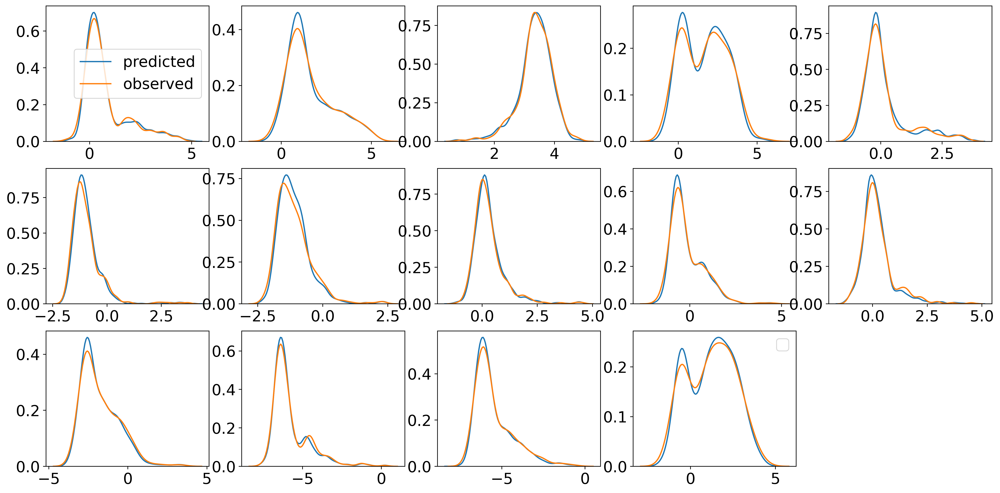

In [15]:
plt.figure(figsize=(20,10),dpi=350)
plt.subplot(3,5,1)
sns.kdeplot(G2[:,0],label="predicted")
sns.kdeplot(T2[:,0],label="observed")

for i in range(1,14):
    plt.subplot(3,5,i+1)
    sns.kdeplot(G2[:,i])
    sns.kdeplot(T2[:,i])
    

plt.legend()

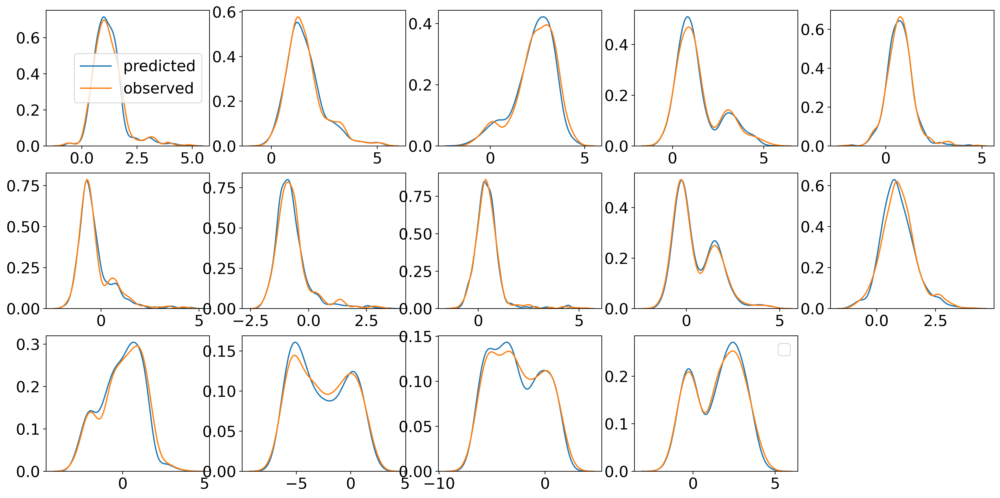

In [16]:
plt.figure(figsize=(20,10),dpi=350)
plt.subplot(3,5,1)
sns.kdeplot(G4[:,0],label="predicted")
sns.kdeplot(T4[:,0],label="observed")

for i in range(1,14):
    plt.subplot(3,5,i+1)
    sns.kdeplot(G4[:,i])
    sns.kdeplot(T4[:,i])

plt.legend()

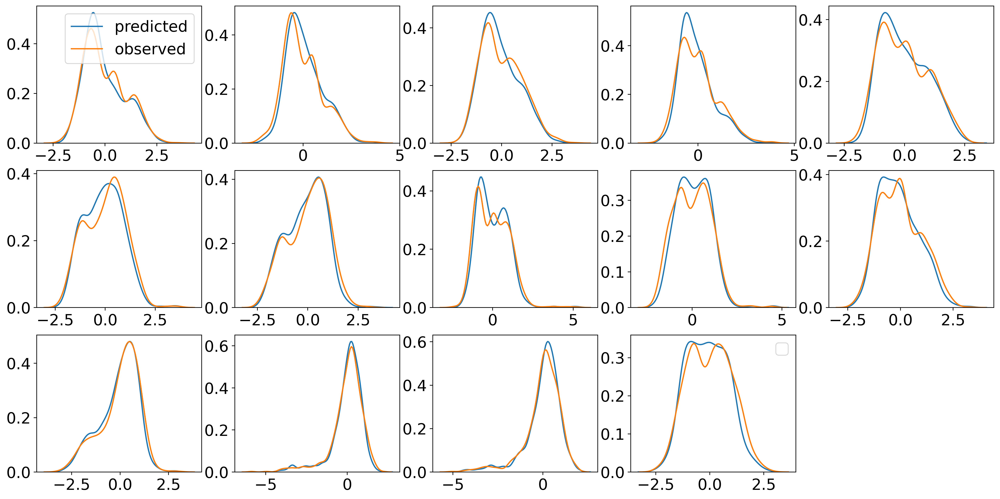

In [17]:
plt.figure(figsize=(20,10),dpi=350)
plt.subplot(3,5,1)
sns.kdeplot(G7[:,0],label="predicted")
sns.kdeplot(T7[:,0],label="observed")

for i in range(1,14):
    plt.subplot(3,5,i+1)
    sns.kdeplot(G7[:,i])
    sns.kdeplot(T7[:,i])
    

plt.legend()

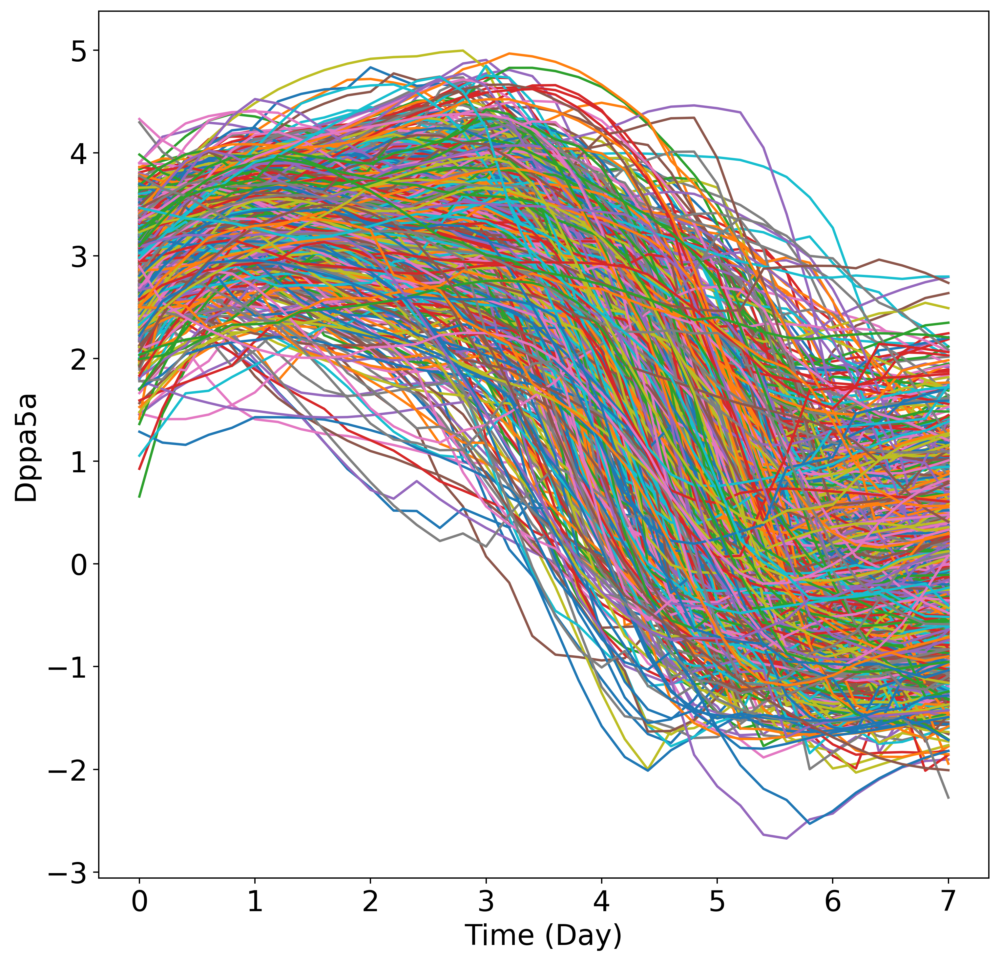

In [14]:
import matplotlib
matplotlib.rcParams.update({'font.size': 18})

plt.figure(figsize=(10,10),dpi=350)
for i in range(933):
    array = path[i,:,2].detach().cpu().numpy()
    plt.plot(np.linspace(0,7,num=36),array)
    
plt.xlabel("Time (Day)")
plt.ylabel("Dppa5a")

plt.savefig("./images/gene14Dppa5a.eps",format="eps")

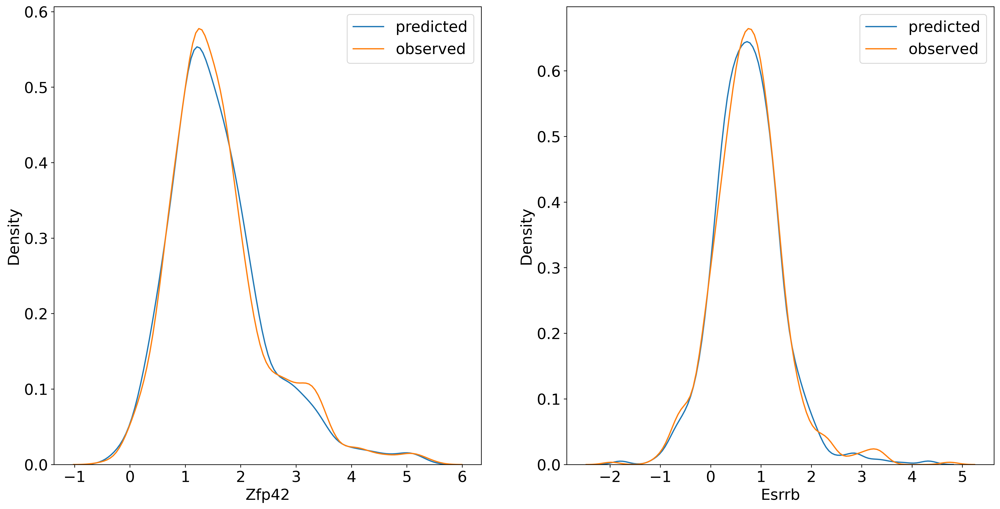

In [19]:
plt.figure(figsize=(20,10),dpi=350)
plt.subplot(1,2,1)
sns.kdeplot(G4[:,1],label="predicted")
sns.kdeplot(T4[:,1],label="observed")
plt.xlabel("Zfp42")
plt.ylabel("Density")

plt.subplot(1,2,2)
sns.kdeplot(G4[:,4],label="predicted")
sns.kdeplot(T4[:,4],label="observed")
plt.xlabel("Esrrb")
plt.ylabel("Density")

plt.legend()

plt.savefig("./images/Zfp42Esrrb.eps",format="eps") #Nanog' 'Zfp42' 'Dppa5a' 'Sox2' 'Esrrb